In [158]:
# 스타벅스 입점 전략 분석

In [254]:
import time
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import koreanize_matplotlib

import folium
from folium.plugins import HeatMap
import geopandas as gpd
import contextily as ctx
from haversine import haversine, Unit

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.cluster import KMeans, MeanShift, DBSCAN


In [2]:
df = pd.read_csv('../processed/df_final.csv', encoding='utf-8-sig')
df.shape

(518844, 33)

In [3]:
df.head(1).T

,0
상호명,부동산임대김은숙
상권업종대분류명,음식
상권업종중분류명,비알코올
상권업종소분류명,카페
시군구명,종로구
행정동코드,1111054000
행정동명,삼청동
지번주소,서울특별시 종로구 삼청동 28-21
도로명주소,서울특별시 종로구 삼청로 122-1
경도,126.98184


## 1. 상권 중심점 찾기
### (1) Kmeans Cluster + Elbow Method
- kmeans 클러스터를 활용해 상권의 중심점 파악.
    - elbow method 활용 시 최적점이 10 수준으로 보이나, 실제 지도에 중심점을 찍어보면 다소 안 맞는 부분이 있었음.
    - k=10부터 k=25까지 1씩 증가시키며 중심점을 지도에 찍어본 결과 19가 가장 타당하다고 결론을 내림.
    - Davies-Bouldin Index 기준 K=17, Calinski-Harabasz Index=19에서 최적값을 보임
    - K=19의 실루엣 계수가 더 높아 최종 K=19로 설정. (sillhouette 계수 계산속도 이슈로 서브 메트릭으로 사용)
    - 아쉬운점: 여의도 상권을 잡아내지 못해서 아쉬움.

In [22]:
df['시군구명'].nunique()

25

In [11]:
n_clusters = 25

def elbow_method(X, max_k=n_clusters):
    wcss = []

    for k in range(2, max_k + 1): #lloy일 경우 1부터 시작 가능
        kmeans = KMeans(n_clusters=k, 
            random_state=42,
            max_iter=300,
            tol=1e-04,
            verbose=0,
            algorithm='elkan' #lloy보다 더 빠르게 수행하기 위함
            )
        kmeans.fit(X)
        wcss.append(kmeans.inertia_)  

    return wcss

start_time = time.time()
wcss_c25 = elbow_method(df[['경도','위도']])
end_time = time.time()
print(f"Elbow Method 수행 시간: {end_time - start_time:.2f}초")

Elbow Method 수행 시간: 20.19초


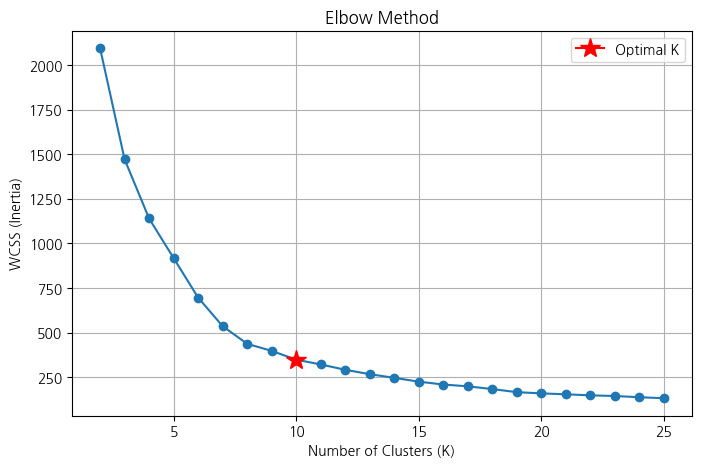

In [15]:
range_k = list(range(2, n_clusters+1))  # X축

# Elbow Plot
plt.figure(figsize=(8, 5))
plt.plot(range_k, wcss_c25, marker='o')
plt.title("Elbow Method")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("WCSS (Inertia)")
plt.grid(True)

# K 강조 
k_star = 10
idx_star = range_k.index(k_star)
wcss_star = wcss_c25[idx_star]

# 빨간 별표 표시
plt.plot(k_star, wcss_star, marker='*', color='red', markersize=15, label="Optimal K")
plt.legend()
plt.show()

In [17]:
Kmeans_cluster = KMeans(n_clusters=10, 
                        random_state=42,
                        max_iter=300,
                        tol=1e-04,
                        verbose=0,
                        algorithm='elkan' #lloy보다 더 빠르게 수행하기 위함
                        )
Kmeans_cluster.fit(df[['경도','위도']])
Kmeans_cluster.cluster_centers_

array([[127.06647983,  37.56658511],
       [126.92677375,  37.54650991],
       [127.03373782,  37.50110979],
       [126.84522582,  37.54063074],
       [127.12677743,  37.51654954],
       [126.89643407,  37.49042272],
       [126.99584933,  37.56638137],
       [127.04620995,  37.63827645],
       [126.92148046,  37.60022096],
       [126.96061984,  37.4904776 ]])

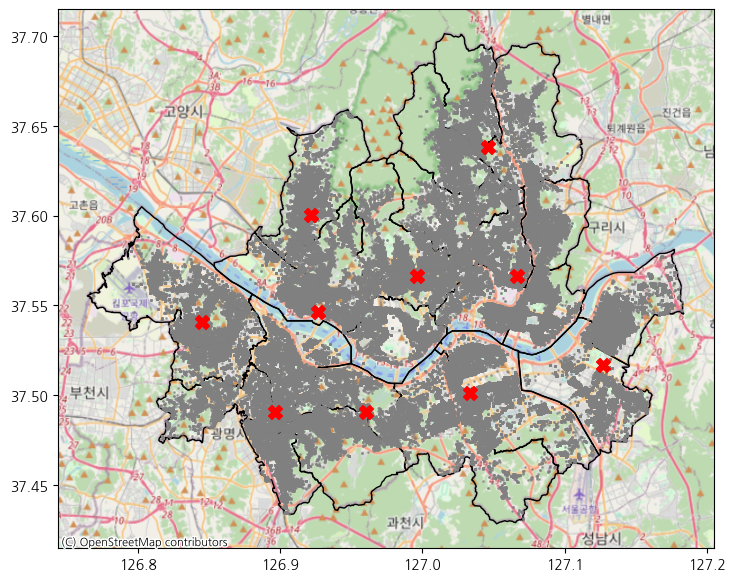

In [45]:
seoul_boundary = gpd.read_file("shp_files/LARD_ADM_SECT_SGG_11_202502.shp")

seoul_boundary = seoul_boundary.to_crs(epsg=4326)
fig, ax = plt.subplots(figsize=(10, 7))

seoul_boundary.plot(ax=ax, edgecolor="black", facecolor="none")

ctx.add_basemap(ax=ax, 
                crs=seoul_boundary.crs, 
                source=ctx.providers.OpenStreetMap.Mapnik)

plt.scatter(df['경도'], df['위도'], c='grey', s=1, alpha=0.6)
plt.scatter(x=Kmeans_cluster.cluster_centers_[:,0], 
            y=Kmeans_cluster.cluster_centers_[:,1], 
            c='red',
            marker='X', 
            s=100, 
            alpha=1)
plt.show()

In [ ]:
def run_kmeans(df, k):
    kmeans = KMeans(n_clusters=k, 
                    random_state=42,
                    max_iter=300,
                    tol=1e-04,
                    verbose=0,
                    algorithm='elkan' #lloy보다 더 빠르게 수행하기 위함
                    )
    kmeans.fit(df[['경도','위도']])
    return kmeans.cluster_centers_

In [160]:
def plot_elbow_with_highlight(wcss, k_highlight=10, save_path=None, ax=None):
    """Elbow Method 플롯 (특정 k 하이라이트)"""
    range_k = list(range(2, 2 + len(wcss)))
    if ax is None:
        fig, ax =  plt.subplots(figsize=(10, 6))

    ax.plot(range_k, wcss, marker='o', linewidth=2, markersize=6, color='blue', label='WCSS')
    ax.plot(k_highlight, wcss[k_highlight-2], marker='*', color='red', markersize=15, label="Optimal K")
    
    ax.set_title(f"Elbow Method (K={k_highlight} highlight)", fontsize=14, fontweight='bold')
    ax.set_xlabel("Number of Clusters (K)", fontsize=12)
    ax.set_ylabel("WCSS", fontsize=12)
    ax.grid(True, alpha=0.3)


    #save
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')

    return ax



In [181]:
def plot_stores(df, k=10, shp_path=None, save_path=None, ax=None):
    """Store 분포 시각화"""
    if ax is None:
        fig, ax =  plt.subplots(figsize=(10, 6))
    
    seoul_boundary = gpd.read_file(shp_path)
    seoul_boundary = seoul_boundary.to_crs(epsg=4326)
    seoul_boundary.plot(ax=ax, edgecolor="black", facecolor="none")

    ctx.add_basemap(ax=ax, 
                    crs=seoul_boundary.crs, 
                    source=ctx.providers.OpenStreetMap.Mapnik)

    ax.scatter(df['경도'], df['위도'], c='grey', s=0.5, alpha=0.6)

    kmeans = KMeans(n_clusters=k, 
                    random_state=42,
                    max_iter=300,
                    tol=1e-04,
                    verbose=0,
                    algorithm='elkan'
                    )
    kmeans.fit(df[['경도','위도']])
    cluster_label = kmeans.fit_predict(df[['경도','위도']]) 

    davies_bouldin = davies_bouldin_score(df[['경도', '위도']], cluster_label)
    calinski_harabasz = calinski_harabasz_score(df[['경도', '위도']], cluster_label)


    ax.scatter(x=kmeans.cluster_centers_[:,0], 
                y=kmeans.cluster_centers_[:,1], 
                c='red',
                marker='X', 
                s=100, 
                alpha=1)

    ax.set_title(f"서울 상점 분포 및 KMeans 중심점 (K={k})", fontsize=14, fontweight='bold')
    ax.set_xlabel("경도", fontsize=12)
    ax.set_ylabel("위도", fontsize=12)

    #save
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    return ax, davies_bouldin, calinski_harabasz

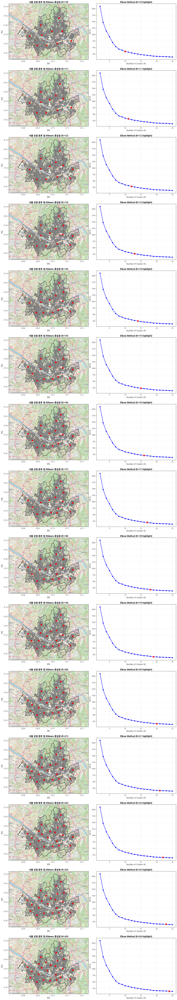

In [183]:
s_path = "shp_files/LARD_ADM_SECT_SGG_11_202502.shp"


fig, axes = plt.subplots(nrows=15, ncols=2, figsize=(8*2, 6*15))
axes = axes.reshape(-1) 

scores = {'k': [], 'davies_bouldin': [], 'calinski_harabasz': []}
for i, k_value in enumerate(range(10, 25)):

    ax_store = axes[i * 2]       # 왼쪽 지도
    ax_elbow = axes[i * 2 + 1]   # 오른쪽 elbow plot
    # row = i // 2
    # col = i % 2
    # ax_store = axes[i][0]
    # ax_elbow = axes[i][1]

    # 왼쪽: 지도 + 클러스터 시각화
    ax_store.set_box_aspect(0.7)
    ax_s, db_score, ch_score = plot_stores(df=df, k=k_value, shp_path=s_path, save_path=None, ax=ax_store)
    scores['k'].append(k_value)
    scores['davies_bouldin'].append(db_score)
    scores['calinski_harabasz'].append(ch_score)
    # 오른쪽: Elbow plot
    ax_elbow.set_box_aspect(0.7)
    plot_elbow_with_highlight(wcss=wcss_c25, k_highlight=k_value, save_path=None, ax=ax_elbow)

plt.tight_layout(h_pad=2.0, w_pad=1.)
plt.show()


In [150]:
kmeans_score = pd.DataFrame(scores)
kmeans_score


,k,davies_bouldin,calinski_harabasz
0,10,0.712084,724440.075163
1,11,0.736493,711516.798567
2,12,0.724469,717373.198312
3,13,0.721951,723298.311265
4,14,0.765039,726500.218680
5,15,0.772400,742205.143761
6,16,0.773038,749484.793410
7,17,0.809110,739506.307523
8,18,0.781387,757695.749126
9,19,0.760087,793103.632565


In [153]:
kmeans_score.iloc[kmeans_score['davies_bouldin'].idxmax()]

k                        17.000000
davies_bouldin            0.809110
calinski_harabasz    739506.307523
Name: 7, dtype: float64

In [154]:
kmeans_score.iloc[kmeans_score['calinski_harabasz'].idxmax()]

k                        19.000000
davies_bouldin            0.760087
calinski_harabasz    793103.632565
Name: 9, dtype: float64

In [139]:
def sample_silhouette_score(df, cluster_label, sample_size=10000, estimator=KMeans):
    df_cluster = df[['위도', '경도']].copy()
    df_cluster['cluster_label'] = cluster_label

    if estimator == 'dbscan':
        cond = (df_cluster['cluster_label'] != -1)
        df_cluster = df_cluster[cond].reset_index(drop=True)
    
    
    sample_indicies = np.random.choice(df_cluster.index, size=sample_size, replace=False)
    df_sample = df_cluster.iloc[sample_indicies]

    silhouette = silhouette_score(df_sample[['경도', '위도']], df_sample['cluster_label'])

    return silhouette

In [155]:
kmeans_17 = KMeans(n_clusters=17, 
                random_state=42,
                max_iter=300,
                tol=1e-04,
                verbose=0,
                algorithm='elkan' #lloy보다 더 빠르게 수행하기 위함
                )

cluster_label_17 = kmeans_17.fit_predict(df[['경도','위도']])

df_17 = df[['경도','위도']].copy()
df_17['cluster_label'] = cluster_label_17

sample_silhouette_score(df_17, cluster_label_17, sample_size=10000, estimator='kmeans')









np.float64(0.4036643190187277)

In [156]:
kmeans_19 = KMeans(n_clusters=19, 
                random_state=42,
                max_iter=300,
                tol=1e-04,
                verbose=0,
                algorithm='elkan' #lloy보다 더 빠르게 수행하기 위함
                )

cluster_label_19 = kmeans_19.fit_predict(df[['경도','위도']])

df_19 = df[['경도','위도']].copy()
df_19['cluster_label'] = cluster_label_19

sample_silhouette_score(df_19, cluster_label_19, sample_size=10000, estimator='kmeans')

np.float64(0.42687253371167444)

In [194]:
kmeans_score.head()

,k,davies_bouldin,calinski_harabasz
0,10,0.712084,724440.075163
1,11,0.736493,711516.798567
2,12,0.724469,717373.198312
3,13,0.721951,723298.311265
4,14,0.765039,726500.218680


In [202]:
kmeans_sample_silhouette_score = sample_silhouette_score(df_19, cluster_label_19, sample_size=10000, estimator='kmeans')
kmeans_davies_bouldin = kmeans_score.loc[kmeans_score['k']==19]['davies_bouldin'].values[0]
kmeans_callinski_harabasz = kmeans_score.loc[kmeans_score['k']==19]['calinski_harabasz'].values[0]

metric_results = {
    'kmeans': {
        'silhouette': kmeans_sample_silhouette_score, 
        'davies_bouldin': kmeans_davies_bouldin, 
        'calinski_harabasz': kmeans_callinski_harabasz
        }
    }
metric_results

{'kmeans': {'silhouette': np.float64(0.42710590809760834),
  'davies_bouldin': np.float64(0.7600869062970815),
  'calinski_harabasz': np.float64(793103.6325646834)}}

### (2) DBSCAN
- 상권 지도는 강남, 명동, 홍대, 성수와 같은 특정 상권에 밀집해 있기 때문에 DBSCAN이 더 적합할 것으로 생각했음. 
- metric으로 성능 평가 시 위 데이터에선 kmeans가 더 높은 성과를 보였음.
- DBSCAN 결과
    - label: 720개
    - Davies-Bouldin Index: 1.4415
    - Calinski-Harabasz Index: 4491.6859
    - 실루엣 계수(샘플 추출): -0.4586290644094235
- 아쉬운점: 홍대 상권을 잡아내지 못함.


In [79]:
db = DBSCAN(eps=0.001, min_samples=10) 
df['dbscan_label'] = db.fit_predict(df[['경도', '위도']])

# 중심점 계산 (Optional)
centroids = df[df['dbscan_label'] != -1].groupby('dbscan_label')[['경도', '위도']].mean().reset_index()


In [86]:
count = df['dbscan_label'].value_counts().reset_index()
count

,dbscan_label,count
0,0,148733
1,6,67205
2,1,59671
3,4,39120
4,16,29411
...,...,...
715,611,9
716,431,8
717,508,7
718,654,7


<Axes: xlabel='dbscan_label', ylabel='count'>

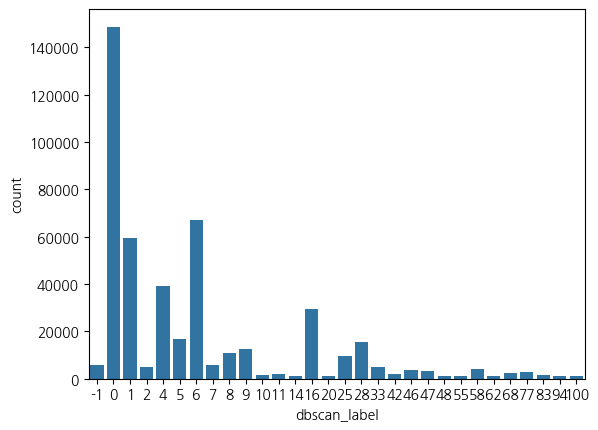

In [95]:
sns.barplot(data=count.iloc[:30,:], x='dbscan_label', y='count')

In [81]:
centroids

,dbscan_label,경도,위도
0,0,126.993422,37.576839
1,1,127.036921,37.506395
2,2,126.854180,37.498244
3,3,126.999485,37.607734
4,4,127.075529,37.567141
...,...,...,...
714,714,126.825081,37.563688
715,715,126.819657,37.565551
716,716,126.951033,37.591972
717,717,127.166585,37.544932


In [98]:
df_dbscan = pd.merge(count, centroids, on='dbscan_label', how='left')
df_dbscan.head()

,dbscan_label,count,경도,위도
0,0,148733,126.993422,37.576839
1,6,67205,126.912926,37.491361
2,1,59671,127.036921,37.506395
3,4,39120,127.075529,37.567141
4,16,29411,126.847046,37.543556


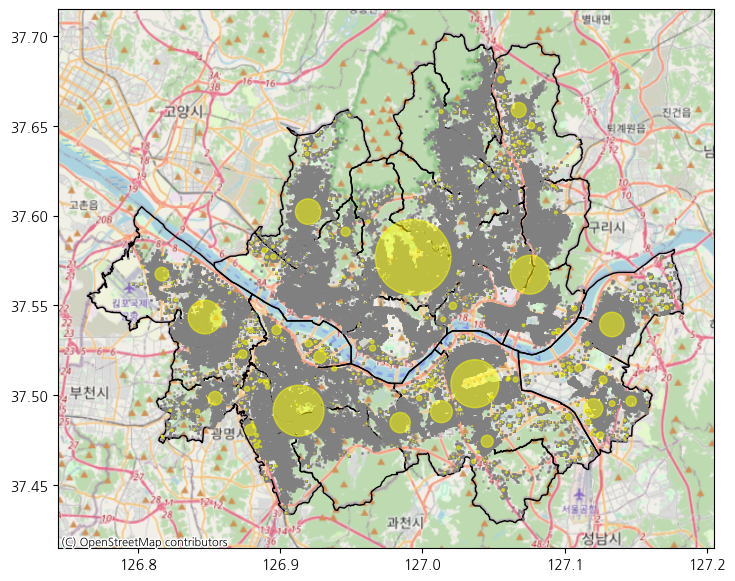

In [279]:
seoul_boundary = gpd.read_file("shp_files/LARD_ADM_SECT_SGG_11_202502.shp")

seoul_boundary = seoul_boundary.to_crs(epsg=4326)
fig, ax = plt.subplots(figsize=(10, 7))

seoul_boundary.plot(ax=ax, edgecolor="black", facecolor="none")


ctx.add_basemap(ax=ax, 
                crs=seoul_boundary.crs, 
                source=ctx.providers.OpenStreetMap.Mapnik)


plt.scatter(df['경도'],
            df['위도'],
            c='grey',
            s=1,
            alpha=0.5)

plt.scatter(df_dbscan['경도'], 
            df_dbscan['위도'], 
            c= 'yellow',
            s=df_dbscan['count']/50,         
            alpha=0.5)


plt.show()

In [200]:
# metrics
# silhouette = silhouette_score(df[['경도', '위도']], cluster_label)
dbscan_davies_bouldin = davies_bouldin_score(df[['경도', '위도']], df['dbscan_label'])
dbscan_calinski_harabasz = calinski_harabasz_score(df[['경도', '위도']], df['dbscan_label'])

# print(f"Silhouette Score: {silhouette:.4f}")
print(f"Davies-Bouldin Index: {dbscan_davies_bouldin:.4f}")
print(f"Calinski-Harabasz Index: {dbscan_calinski_harabasz:.4f}")

Davies-Bouldin Index: 1.4415
Calinski-Harabasz Index: 4491.6859


In [203]:
dbscan_sample_silhouette_score = sample_silhouette_score(df, cluster_label=df['dbscan_label'], sample_size=10000, estimator='dbscan')

print(f"Silhouette Score: {dbscan_sample_silhouette_score:.4f}")

metric_results['dbscan'] = {
    'silhouette': dbscan_sample_silhouette_score, 
    'davies_bouldin': dbscan_davies_bouldin, 
    'calinski_harabasz': dbscan_calinski_harabasz
}


Silhouette Score: -0.4830


### (3) MeanShift 
- 비모수적 커널 밀도 추정 방식으로 밀도 기반으로 빠르게 테스트 가능할 것 같아 선정
- Metric
    - Silhouette Score: 0.3534
    - Davies-Bouldin Index: 0.8712
    - Calinski-Harabasz Index: 962.5540


In [192]:
X = df[['경도','위도']]
X_idx = np.random.choice(len(X), size=1000, replace=False)
sample_X = X.loc[X_idx].reset_index(drop=True)

meanshift = MeanShift(bandwidth=0.05) # 대역폭을 더 테스트해보면 좋을 것.
meanshift.fit(sample_X)

sample_X['meanshift_label'] = meanshift.labels_

In [208]:
meanshift_sample_silhouette_score = silhouette_score(sample_X[['경도', '위도']],sample_X['meanshift_label'])
meanshift_davies_bouldin = davies_bouldin_score(sample_X[['경도', '위도']], sample_X['meanshift_label'])
meanshift_calinski_harabasz = calinski_harabasz_score(sample_X[['경도', '위도']], sample_X['meanshift_label'])

print(f"Silhouette Score: {meanshift_sample_silhouette_score:.4f}" )
print(f"Davies-Bouldin Index: {meanshift_davies_bouldin:.4f}")
print(f"Calinski-Harabasz Index: {meanshift_calinski_harabasz:.4f}")

metric_results['meanshift'] = {
        'silhouette': meanshift_sample_silhouette_score, 
        'davies_bouldin': meanshift_davies_bouldin, 
        'calinski_harabasz': meanshift_calinski_harabasz
    }


Silhouette Score: 0.3534
Davies-Bouldin Index: 0.8712
Calinski-Harabasz Index: 962.5540


## (4) 최종결과 해석
- slhouette: 실루엣 계수 기준 KMeans(k=19)가 가장 값이 높음.
- Davies-Bouldin: KMeans(k=19) 값이 가장 낮음.
- Calinski-Harabasz(K=19) 값이 가장 높음.

In [216]:
result = pd.DataFrame(metric_results)
result = result.T
result.style.background_gradient(cmap='Blues', subset=result.columns)

,silhouette,davies_bouldin,calinski_harabasz
kmeans,0.427106,0.760087,793103.632565
dbscan,-0.483042,1.441474,4491.685892
meanshift,0.353353,0.871199,962.553986


# 2. 파생변수 생성: 상권 중심점
- 상권 중심점을 바탕으로 상점에서 가장 가까운 중심점 및 거리 반환
    - 사용 함수: closest_radian
    - 주요 개념: 라디안(각도) 변환(numpy) -> 중심점 기준 BallTree생성(sklearn) ->  앞에서 만들어진 BallTree에 상점데이터 대입 -> 가장 가까운 라디안 반환 -> 라디안 * 지구반지름 -> 거리 반환

In [256]:
# def closest_radian(df1, df2, df2_col, lat_col='위도', lon_col='경도'):
#     """
#     df1 좌표에서 가장 가까운 df2 좌표 추출 후 거리 및 컬럼 반환
#     process: 
#         1. df1,df2 좌표를 라디안으로 변환 (좌표 -> 각도)
#         2. BallTree 생성 (haversine 거리 사용) (df2 기준 트리를 그려둠)
#         4. df1 좌표에 대해 가장 가까운 df2 좌표 인덱스 및 거리 추출 (df2 트리 기준으로 df1에서 가장 가까운 값을 선택)
#         5. 거리: 라디안 → km (지구 반지름 6371km 사용) (라디안 → km 변환 시 6371km 사용)
#         6. 가장 가까운 df2의 특정 컬럼 값 추출

#     df1: 중심점 데이터프레임
#     df2: 상점 데이터프레임
#     df2_col: 상점 데이터프레임에서 추출할 컬럼
#     lat_col: 위도 컬럼
#     lon_col: 경도 컬럼
#     """

#     df1_coords = np.radians(df1[[lat_col, lon_col]].to_numpy())# 좌표를 라디안으로 변환
#     df2_coords = np.radians(df2[[lat_col, lon_col]].to_numpy())

#     tree = BallTree(df2_coords, metric='haversine') 
#     distances, indices = tree.query(df1_coords, k=1)

#     distances_km = distances.flatten() * 6371 
#     closest_values = df2.iloc[indices.flatten()][df2_col].reset_index(drop=True)

#     # 반환: 거리(km), df2_col
#     return distances_km, closest_values

In [255]:
df_centers = pd.DataFrame(kmeans_19.cluster_centers_, columns=['경도', '위도'])


In [252]:
df_19['cluster_center_x'] = df_19['cluster_label'].map(df_centers['경도'])
df_19['cluster_center_y'] = df_19['cluster_label'].map(df_centers['위도'])

df_19.head()

,경도,위도,cluster_label,cluster_center_x,cluster_center_y
0,126.981840,37.586250,17,126.989206,37.568944
1,127.024563,37.500924,2,127.028267,37.519883
2,127.054262,37.564786,12,127.070437,37.550204
3,126.993820,37.570025,17,126.989206,37.568944
4,126.855046,37.486242,3,126.857611,37.519045


In [260]:
#  haversine 거리 계산 

df_19['거리'] = df_19.apply(
    lambda row: haversine( # 위도, 경도 순
        (row['위도'], row['경도']), # 비교대상1의 위도, 경도
        (row['cluster_center_y'], row['cluster_center_x']) # 비교대상2의 위도, 경도
        , unit=Unit.KILOMETERS
    ), 
    axis=1
)

df_19.head()

# df_19['cluster_center_distance'] = distance

# df_19.head()

,경도,위도,cluster_label,cluster_center_x,cluster_center_y,거리
0,126.981840,37.586250,17,126.989206,37.568944,2.030925
1,127.024563,37.500924,2,127.028267,37.519883,2.133235
2,127.054262,37.564786,12,127.070437,37.550204,2.159205
3,126.993820,37.570025,17,126.989206,37.568944,0.424001
4,126.855046,37.486242,3,126.857611,37.519045,3.654535


In [264]:
df['상권중심점'] = df_19['cluster_label'].copy()
df['상권중심점_거리'] = df_19['거리'].copy()
df['상권중심점_거리'] = round(df['상권중심점_거리'], 2)

df.head()

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시군구명,행정동코드,행정동명,지번주소,도로명주소,경도,...,20세_25세,26세_30세,31세_40세,41세_50세,51세_60세,61세_109세,평당거래금액(만원),dbscan_label,상권중심점,상권중심점_거리
0,부동산임대김은숙,음식,비알코올,카페,종로구,1111054000,삼청동,서울특별시 종로구 삼청동 28-21,서울특별시 종로구 삼청로 122-1,126.981840,...,108,143,275,298,333,770,583.0,0,17,2.03
1,한국황토건축연구소,부동산,부동산 서비스,부동산 중개/대리업,서초구,1165053100,서초4동,서울특별시 서초구 서초동 1308-25,서울특별시 서초구 서초대로73길 40,127.024563,...,2066,1608,3139,5840,5168,5956,174.2,1,2,2.13
2,소망공인중개사사무소,부동산,부동산 서비스,부동산 중개/대리업,성동구,1120079000,용답동,서울특별시 성동구 용답동 4-11,서울특별시 성동구 용답중앙15길 18,127.054262,...,1124,1906,2169,1302,1834,3104,623.1,0,12,2.16
3,고향집,음식,한식,백반/한정식,종로구,1111061500,종로1.2.3.4가동,서울특별시 종로구 장사동 80,서울특별시 종로구 돈화문로4길 30,126.993820,...,378,695,966,836,1080,2384,147.8,0,17,0.42
4,보석나라,소매,시계·귀금속 소매,시계/귀금속 소매업,구로구,1153076000,개봉3동,서울특별시 구로구 개봉동 359-8,서울특별시 구로구 개봉로3길 23,126.855046,...,1011,1250,2377,2681,3360,6403,63.6,2,3,3.65


In [265]:
df.to_csv('../processed/analysis_df.csv', index=False, encoding='utf-8-sig')

In [285]:
df = pd.read_csv('../processed/analysis_df.csv', encoding='utf-8-sig')

In [272]:
df_starbucks = df[df['스타벅스']==1]

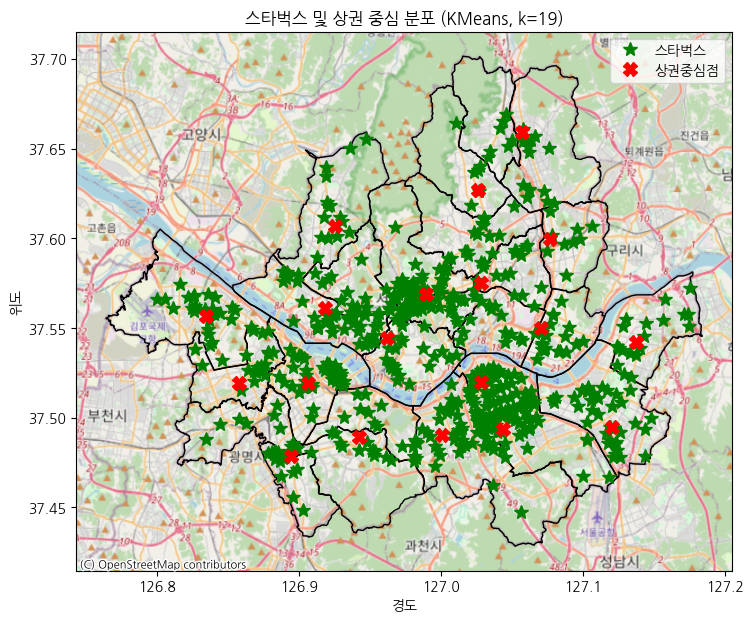

In [277]:
seoul_boundary = gpd.read_file(s_path)

seoul_boundary = seoul_boundary.to_crs(epsg=4326)
fig, ax = plt.subplots(figsize=(10, 7))

seoul_boundary.plot(ax=ax, edgecolor="black", facecolor="none")

ctx.add_basemap(ax=ax, 
                crs=seoul_boundary.crs, 
                source=ctx.providers.OpenStreetMap.Mapnik)

df_starbucks.plot(
    ax=ax,
    x='경도',
    y='위도', 
    linestyle="", 
    color="green", 
    marker="*", 
    markersize=10, 
    label="스타벅스")

df_centers.plot(ax=ax,
        x='경도',
        y='위도',
        color='red',
        linestyle="",
        marker="X",
        markersize=10,
        label='상권중심점')

plt.xlabel('경도')
plt.ylabel('위도')
plt.title('스타벅스 및 상권 중심 분포 (KMeans, k=19)')
plt.show()

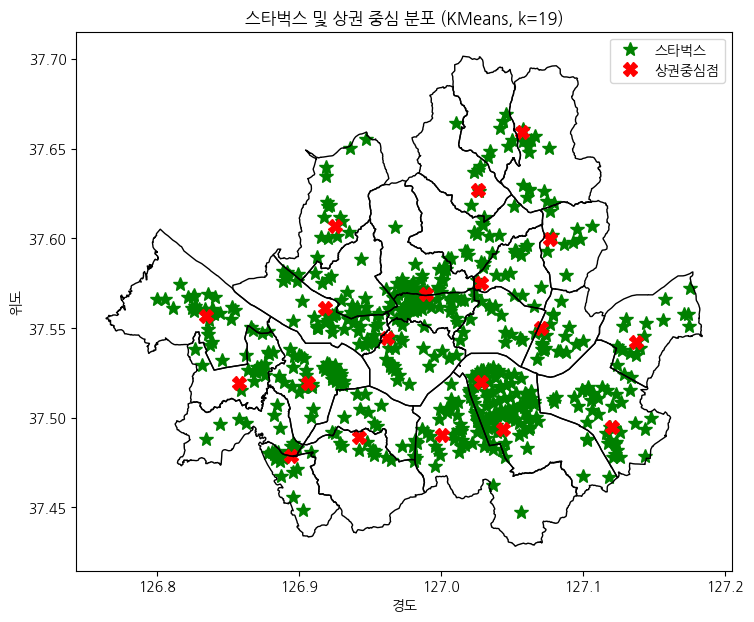

In [282]:
seoul_boundary = gpd.read_file(s_path)

seoul_boundary = seoul_boundary.to_crs(epsg=4326)
fig, ax = plt.subplots(figsize=(10, 7))


# ctx.add_basemap(ax=ax, 
#                 crs=seoul_boundary.crs, 
#                 source=ctx.providers.OpenStreetMap.Mapnik)

df_starbucks.plot(
    ax=ax,
    x='경도',
    y='위도', 
    linestyle="", 
    color="green", 
    marker="*", 
    markersize=10, 
    label="스타벅스",
    zorder=1)

df_centers.plot(ax=ax,
    x='경도',
    y='위도',
    color='red',
    linestyle="",
    marker="X",
    markersize=10,
    label='상권중심점',
    zorder=2)

seoul_boundary.plot(ax=ax, 
    edgecolor="black", 
    facecolor="none", 
    zorder=3)

plt.xlabel('경도')
plt.ylabel('위도')
plt.title('스타벅스 및 상권 중심 분포 (KMeans, k=19)')
plt.show()

## EDA

In [286]:
df.head(1).T

,0
상호명,부동산임대김은숙
상권업종대분류명,음식
상권업종중분류명,비알코올
상권업종소분류명,카페
시군구명,종로구
행정동코드,1111054000
행정동명,삼청동
지번주소,서울특별시 종로구 삼청동 28-21
도로명주소,서울특별시 종로구 삼청로 122-1
경도,126.98184


In [287]:
df_original = df.copy()

# 행정동별 인구수를 활용해 나이대별 인구 비율 계산
age_cols = ['0세_6세', '7세_19세', '20세_25세', '26세_30세', '31세_40세', '41세_50세', '51세_60세', '61세_109세']
age_ratio_cols = [f'ratio_{col}' for col in age_cols]

for (original_col, new_col) in zip(age_cols, age_ratio_cols):
    df[new_col] = df[original_col] / df['계']
    df[new_col] = df[new_col].round(2)

In [289]:
df.head(1).T

,0
상호명,부동산임대김은숙
상권업종대분류명,음식
상권업종중분류명,비알코올
상권업종소분류명,카페
시군구명,종로구
행정동코드,1111054000
행정동명,삼청동
지번주소,서울특별시 종로구 삼청동 28-21
도로명주소,서울특별시 종로구 삼청로 122-1
경도,126.98184


In [ ]:
df.drop(columns=age_cols, inplace=True)

df_starbucks = df[df['스타벅스'] == 1]